In [1]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 kB 10.2 MB/s eta 0:00:00


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split 
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay #plots confusion matrix
#from sklearn.metrics import plot_confusion_matrix #draws a confusion matrix #deprecated; use ConfusionMatrixDisplay instead
import shap
import os

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Parse doctor file
Parsed data stored into a dataframe. 
doctor_gender dictionary created to store gender of doctors.

In [ ]:
path = '/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/fem_dr_dark_56'

In [ ]:
path = '/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/fem_dr_light_256'

In [ ]:
path = '/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/mal_dr_dark_62'

In [ ]:
path = '/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/mal_dr_light_308'

In [4]:
doctor_gender = {}  # key: file name  value: male or female
female_dr_dark = os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/fem_dr_dark_56")
doctor_gender.update(dict.fromkeys(female_dr_dark, "female"))
female_dr_light = os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/fem_dr_light_256")
doctor_gender.update(dict.fromkeys(female_dr_light, "female"))

male_dr_dark = os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/mal_dr_dark_62")
doctor_gender.update(dict.fromkeys(male_dr_dark, "male"))
male_dr_light = os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/mal_dr_light_308")
doctor_gender.update(dict.fromkeys(male_dr_light, "male"))

In [5]:
#new
print(len(female_dr_dark))
print(len(female_dr_light))
print(len(male_dr_dark))
print(len(male_dr_light))


56
246
62
302


In [6]:
#new
len(doctor_gender.keys())

666

In [7]:
#new
nurse_gender = {}  # key: file name  value: male or female
female_nurse_dark = os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/nurse/fem_nurse_dark_63")
nurse_gender.update(dict.fromkeys(female_nurse_dark, "female"))
female_nurse_light = os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/nurse/fem_nurse_light_252")
nurse_gender.update(dict.fromkeys(female_nurse_light, "female"))

male_nurse_dark = os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/nurse/mal_nurse_dark_76")
nurse_gender.update(dict.fromkeys(male_nurse_dark, "male"))
male_nurse_light = os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/nurse/mal_nurse_light_203")
nurse_gender.update(dict.fromkeys(male_nurse_light, "male"))

In [8]:
#new
print(len(female_nurse_dark))
print(len(female_nurse_light))
print(len(male_nurse_dark))
print(len(male_nurse_light))

63
252
76
203


In [9]:
#new
len(nurse_gender.keys())

594

In [10]:
os.listdir("/content/drive/My Drive/anomaly-explain/datasets/doctor_nurse/dr/")

['.DS_Store',
 'fem_dr_dark_56',
 'mal_dr_dark_62',
 'mal_dr_light_308',
 'fem_dr_light_256']

In [11]:
path = '/content/drive/My Drive/anomaly-explain/labels_doctor.txt'

In [12]:
index = 0
data = []  # stores the data which will be converted into a dataframe
full_file = open("/content/drive/My Drive/anomaly-explain/labels_doctor.txt")
content = full_file.readlines()



with open("/content/drive/My Drive/anomaly-explain/labels_doctor.txt") as file:
    for line in file:
        index += 1
        row = {}  # row dictionary will be addded to dataframe
        
        if line.find(".jpg") >= 0:
            nextLine = content[index-1]
            row["id"] = nextLine.strip()
            row["gender"] = doctor_gender[nextLine.strip()]
            
            nextLineIndex = 2
            # this will loop through next 10 lines
            for i in range(9):
                nextLine = content[index + nextLineIndex]
                nextLineIndex += 1
                split0 = nextLine.split(' ', 1)
                feature = split0[1].strip()
                split1 = feature.split('  ', 1)
                feature = split1[0].strip()
                value = split1[1].strip()
                # print(f"feature: {feature}, value: {value}")
                row[feature] = value
                
            # add row dictionary to data array
            data.append(row)
            
        # if not the line before feature data then continue to next line
        elif line.find("Label") == -1:  
            continue

        

dataFrame_doc = pd.DataFrame(data)

# Deleting 72 rows to have # of doctors = # of nurses
remove_n = 23
drop_indices = np.random.choice(dataFrame_doc.index, remove_n, replace=False)
dataFrame_doctor = dataFrame_doc.drop(drop_indices)

# inserting label column. 1 = doctor, 0 = nurse.
dataFrame_doctor.insert(0 ,"Label", 1)
pd.set_option('display.max_columns', 5)
print(dataFrame_doctor.head(10))
print(dataFrame_doctor.shape)
print(dataFrame_doctor.columns)

    Label                                                 id  ...  \
0       1        508. 168360297-56a46dc63df78cf7728260c0.jpg  ...   
1       1  45. muslim-female-doctor-in-hijab-with-stethos...  ...   
2       1  54. female-doctor-portrait-picture-id641923702...  ...   
3       1  439. whatadoctorlookslike-hashtag-tamika-cross...  ...   
5       1  176. female-dr-comforting-patient-article.__v9...  ...   
6       1  80. doctorimage_320x400_1a4d58a0295a2931ab2649...  ...   
7       1   252. ThinkstockPhotos-86492459%20-%20cropped.jpg  ...   
8       1  377. female-doctor-talking-to-senior-couple_0.jpg  ...   
9       1  277. man-talking-to-woman-doctor-istock8666719...  ...   
10      1  283. 16-Surprising-Things-Doctors-Want-Women-t...  ...   

   Television set Flat panel display  
0             NaN                NaN  
1             NaN                NaN  
2             NaN                NaN  
3             NaN                NaN  
5             NaN                NaN  
6     

In [13]:
dataFrame_doc

,id,gender,...,Television set,Flat panel display
0,508. 168360297-56a46dc63df78cf7728260c0.jpg,female,...,NaN,NaN
1,45. muslim-female-doctor-in-hijab-with-stethos...,female,...,NaN,NaN
2,54. female-doctor-portrait-picture-id641923702...,female,...,NaN,NaN
3,439. whatadoctorlookslike-hashtag-tamika-cross...,female,...,NaN,NaN
4,388. 37957917-portrait-confident-african-ameri...,female,...,NaN,NaN
...,...,...,...,...,...
612,466. phototake_rm_photo_of_doctor_with_bladder...,male,...,NaN,NaN
613,34. 800px_COLOURBOX2345743.jpg,male,...,NaN,NaN
614,70. 72329138-male-doctor-in-his-office-looking...,male,...,NaN,NaN
615,440. male-doctor.jpg,male,...,NaN,NaN


In [14]:
t = dataFrame_doc[dataFrame_doc.gender == 'female']
t

,id,gender,...,Television set,Flat panel display
0,508. 168360297-56a46dc63df78cf7728260c0.jpg,female,...,NaN,NaN
1,45. muslim-female-doctor-in-hijab-with-stethos...,female,...,NaN,NaN
2,54. female-doctor-portrait-picture-id641923702...,female,...,NaN,NaN
3,439. whatadoctorlookslike-hashtag-tamika-cross...,female,...,NaN,NaN
4,388. 37957917-portrait-confident-african-ameri...,female,...,NaN,NaN
...,...,...,...,...,...
281,285. image-female-doctor-gesturing-to-hospital...,female,...,NaN,NaN
282,358. female-doctor-consults-with-female-hispan...,female,...,NaN,NaN
283,471. female-doctor.jpg,female,...,NaN,NaN
284,267. 43364348-doctor-female-doctor-women-.jpg,female,...,NaN,NaN


# Parse nurse file
Parsed data stored into a dataframe

In [15]:
path = '/content/drive/My Drive/anomaly-explain/labels_nurse.txt'

In [16]:
index = 0
data = []  # stores the data which will be converted into a dataframe
full_file = open("/content/drive/My Drive/anomaly-explain/labels_nurse.txt")
content = full_file.readlines()

with open("/content/drive/My Drive/anomaly-explain/labels_nurse.txt") as file:
    for line in file:
        index += 1
        row = {}  # row dictionary will be added to dataframe
        
        # fn = female nurse
        if line.find("fn") >= 0:
            nextLine = content[index-1]
            split = nextLine.split(' ', 1)
#             print(split[1])
            row["id"] = split[1].strip()
            row["gender"] = "female"
        
            nextLineIndex = 2
            # this will loop through next 10 lines
            for i in range(9):
                nextLine = content[index + nextLineIndex]
                nextLineIndex += 1
                split0 = nextLine.split(' ', 1)
                feature = split0[1].strip()
                split1 = feature.split('  ', 1)
                feature = split1[0].strip()
                value = split1[1].strip()
                # print(f"feature: {feature}, value: {value}")
                row[feature] = value
                
            # add row dictionary to data array
            data.append(row)
            
        # mn = male nurse
        elif line.find("mn") >= 0:
            nextLine = content[index-1]
            split = nextLine.split(' ', 1)
#             print(split[1])
            row["id"] = split[1].strip()
            row["gender"] = "male"
        
            nextLineIndex = 2
            # this will loop through next 10 lines
            for i in range(9):
                nextLine = content[index + nextLineIndex]
                nextLineIndex += 1
                split0 = nextLine.split(' ', 1)
                feature = split0[1].strip()
                split1 = feature.split('  ', 1)
                feature = split1[0].strip()
                value = split1[1].strip()
                row[feature] = value
    
            # add row dictionary to data array
            data.append(row)
        

dataFrame_nurse = pd.DataFrame(data)

# inserting label column. 1 = doctor, 0 = nurse.
dataFrame_nurse.insert(0 ,"Label", 0)
pd.set_option('display.max_columns', 5)
print(dataFrame_nurse.head(10))
print(dataFrame_nurse.shape)
print(dataFrame_nurse.columns)


   Label                                                 id  ...  \
0      0                           341. nurse_684816040.jpg  ...   
1      0            234. ANS-Clinical-Nurse-Hero-mobile.jpg  ...   
2      0  109. female-nurse-helping-to-a-girl-patient-to...  ...   
3      0               438. 3050196_female-black-nurse-.jpg  ...   
4      0      437. cb88ddac-42d1-4176-94b7-483ed2d8d189.jpg  ...   
5      0  159. 42307113-portrait-of-female-nurse-with-di...  ...   
6      0  534. bigstock-Boy-Talking-To-Female-Nurse-In-5...  ...   
7      0   310. MSHS-PalliativeCare-Carousel-1920x600-1.jpg  ...   
8      0                         550. about_with_header.jpg  ...   
9      0  303. UK-nhs-cervical-smear-transexual-678x381.jpg  ...   

  Computed tomography Jacket  
0                 NaN    NaN  
1                 NaN    NaN  
2                 NaN    NaN  
3                 NaN    NaN  
4                 NaN    NaN  
5                 NaN    NaN  
6                 NaN    NaN  
7  

In [17]:
t = dataFrame_nurse[dataFrame_nurse.gender == 'female']
t

,Label,id,...,Computed tomography,Jacket
0,0,341. nurse_684816040.jpg,...,NaN,NaN
1,0,234. ANS-Clinical-Nurse-Hero-mobile.jpg,...,NaN,NaN
2,0,109. female-nurse-helping-to-a-girl-patient-to...,...,NaN,NaN
3,0,438. 3050196_female-black-nurse-.jpg,...,NaN,NaN
4,0,437. cb88ddac-42d1-4176-94b7-483ed2d8d189.jpg,...,NaN,NaN
...,...,...,...,...,...
310,0,161. 31022023-portrait-of-female-nurse-working...,...,NaN,NaN
311,0,2. nurse-female-250x250.jpg,...,NaN,NaN
312,0,335. female-nurse-caring-for-elderly-woman.jpg,...,NaN,NaN
313,0,577. ky-nursing-degrees.jpg,...,NaN,NaN


# Dataframe processing - Unbiased Data
Concatenating the two dataframes, filling missing values with 0

In [18]:
dataFrame = pd.concat([dataFrame_doctor, dataFrame_nurse], ignore_index=True)

dataFrame = dataFrame.fillna(0)
print(dataFrame_doctor.shape)
print(dataFrame_nurse.shape)
print(dataFrame.shape)

(594, 305)
(594, 340)
(1188, 405)


# SVM Classifier - Unbiased Data

In [19]:
# Google API uses nurse as feature for a few examples. Need to remove column for Nurse
dataFrame.drop('Nurse', axis = 1)
# store dataframe into x
x = dataFrame.copy() 
# y contains the labels of the dataframe
y = dataFrame['Label'].copy() 

# train test split. Need to store label gender and id of test set. Drop these columns after storing
# labeled data into x_test_labeled.
x_train, x_test_labeled, y_train, y_test = train_test_split(x, y, random_state = 30)

x_train = x_train.drop(['Label', 'gender', 'id'], axis = 1)
x_test = x_test_labeled.drop(['Label', 'gender', 'id'], axis = 1).copy()

# print(x_train.head(10))
# print(x_test.head(10))
# print(x_test_labeled.head(10))

Doctors-nurses unbiased dataset:
Accuracy = 71.72%
Error = 28.28%
Precision = 0.7612903225806451
Recall = 0.7151515151515152
F1 score = 0.7374999999999999


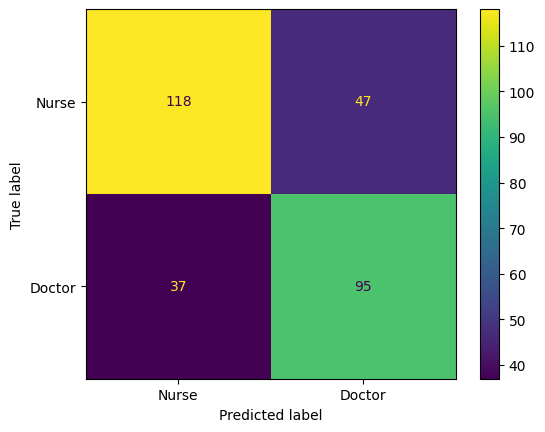

In [20]:
clf_svm = SVC(C = 10, gamma = 'scale', probability=True)
clf_svm.fit(x_train, y_train)

# confusion matrix of test data predictions
predictions = clf_svm.predict(x_test)
cm = confusion_matrix(y_test, predictions, labels=clf_svm.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix= cm, display_labels = ["Nurse", "Doctor"]) 

print("Doctors-nurses unbiased dataset:")

# accuracy
correct = disp.confusion_matrix[0,0] + disp.confusion_matrix[1,1]
accuracy = correct/(disp.confusion_matrix[0,0] + disp.confusion_matrix[0,1] + disp.confusion_matrix[1,0] + disp.confusion_matrix[1,1])
print(f"Accuracy = {accuracy*100:.2f}%")
error = 1 - accuracy
print(f"Error = {error*100:.2f}%")
precision = disp.confusion_matrix[0,0] / (disp.confusion_matrix[0,0] + disp.confusion_matrix[1,0])
print(f"Precision = {precision}")
recall = disp.confusion_matrix[0,0] / (disp.confusion_matrix[0,0] + disp.confusion_matrix[0,1])
print(f"Recall = {recall}")
f1 = (2 * precision * recall) / (precision + recall)
print(f"F1 score = {f1}")

disp.plot()
plt.show()

In [ ]:
for col in dataFrame.columns:
    print(col)

Label
id
gender
Hand
Health care
Research
Vision care
Stethoscope
Scientist
Chemistry
Laboratory equipment
Eyelash
Eyebrow
Facial expression
Sleeve
Street fashion
Black hair
Abaya
Event
Fashion design
Happy
White coat
Health care provider
Hearing
Medical assistant
Medical
Nurse
Science
Jheri curl
Ringlet
Afro
Cosmetic dentistry
Smile
Eye
Coat
Microphone
Blazer
Spokesperson
Gesture
Physician
Skin
Medical equipment
Hairstyle
Electric blue
Elbow
Computer
Computer keyboard
Desk
Personal computer
Computer monitor
Computer desk
Peripheral
Office supplies
Engineering
White-collar worker
Service
Picture frame
Job
Trousers
Shoulder
Comfort
Knee
Thigh
Speech
Sitting
Public speaking
Outerwear
White
Dress shirt
Standing
Collar
Magnifier
Flash photography
Eyewear
Leg
Human body
Neck
Dress
Gadget
Scrubs
Patient
Arm
Uniform
Jewellery
Joint
Head
Workwear
Audio equipment
Jersey
Azure
Necklace
Shirt
Natural environment
Social group
Community
Leisure
T-shirt
Adaptation
Room
Blue
Building
Window
Chin
Temp

In [21]:
from google.colab.data_table import DataTable
DataTable.max_columns = 405
x_test_labeled

,Label,id,...,Cuff,Computed tomography
805,0,149. Nursing-courses-image-2.jpg,...,0,0
272,1,471. female-doctor.jpg,...,0,0
613,0,198. 1140-nurse-wheelchair-home-care-health.im...,...,0,0
278,1,217. GettyImages-463029399-56a845745f9b58b7d0f...,...,0,0
277,1,181. providers-blackmaledoctor-banner-small.jpg,...,0,0
...,...,...,...,...,...
550,1,180. portrait-confident-indian-male-doctor-sho...,...,0,0
944,0,141. clinicg909340246_1431533.jpg,...,0,0
705,0,187. master-nurse-practitioner.jpg,...,0,0
681,0,3. female-nurse.jpg,...,0,0


# Dataframe processing - 10:1 Bias
Concatenating the two dataframes, filling missing values with 0

In [22]:
#new
#for 10:1 bias:
#dataframe processing with bias:
dataFrame_doctor_male10_bias = dataFrame_doctor[dataFrame_doctor.gender == 'male'].sample(frac=1, random_state = 0)
print(dataFrame_doctor_male10_bias.shape)
dataFrame_doctor_female1_bias = dataFrame_doctor[dataFrame_doctor.gender == 'female'].sample(frac=0.115, random_state = 0)
print(dataFrame_doctor_female1_bias.shape)
dataFrame_nurse_male1_bias = dataFrame_nurse[dataFrame_nurse.gender == 'male'].sample(frac=0.113, random_state = 0)
print(dataFrame_nurse_male1_bias.shape)
dataFrame_nurse_female10_bias = dataFrame_nurse[dataFrame_nurse.gender == 'female'].sample(frac=1, random_state = 0)
print(dataFrame_nurse_female10_bias.shape)
dataFrame_bias10_1 = pd.concat([dataFrame_doctor_male10_bias, dataFrame_doctor_female1_bias, dataFrame_nurse_male1_bias, dataFrame_nurse_female10_bias], ignore_index=True)

dataFrame_bias10_1 = dataFrame_bias10_1.fillna(0)
print(dataFrame_bias10_1.shape)


(319, 305)
(32, 305)
(32, 340)
(315, 340)
(698, 405)


# SVM Classifier - 10: 1 Bias

In [23]:
#new
#for 10:1 bias:
# Google API uses nurse as feature for a few examples. Need to remove column for Nurse
dataFrame_bias10_1.drop('Nurse', axis = 1)
# store dataframe into x
x = dataFrame_bias10_1.copy() 
# y contains the labels of the dataframe
y = dataFrame_bias10_1['Label'].copy() 

# train test split. Need to store label gender and id of test set. Drop these columns after storing
# labeled data into x_test_labeled.
x_train_bias, x_test_labeled_bias, y_train_bias, y_test_bias = train_test_split(x, y, random_state = 30)

x_train_bias = x_train_bias.drop(['Label', 'gender', 'id'], axis = 1)
x_test_bias = x_test_labeled_bias.drop(['Label', 'gender', 'id'], axis = 1).copy()

# print(x_train.head(10))
# print(x_test.head(10))
# print(x_test_labeled.head(10))

Doctors-nurses 10:1 bias dataset:
Accuracy = 74.86%
Error = 25.14%
Precision = 0.7473684210526316
Recall = 0.7802197802197802
F1 score = 0.7634408602150539


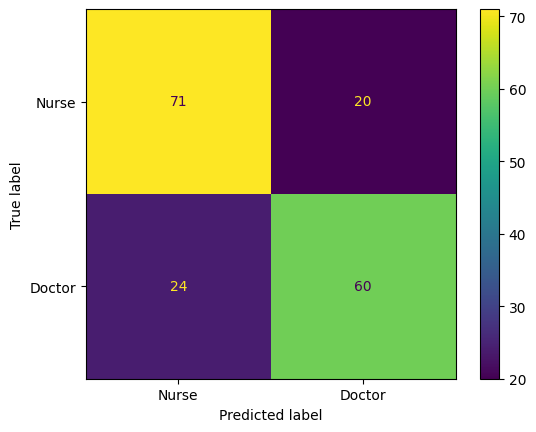

In [24]:
#new
#for 10:1 bias:
clf_svm_bias = SVC(C = 10, gamma = 'scale', probability=True)
clf_svm_bias.fit(x_train_bias, y_train_bias)

# confusion matrix of test data predictions
predictions = clf_svm_bias.predict(x_test_bias)
cm = confusion_matrix(y_test_bias, predictions, labels=clf_svm_bias.classes_)
disp_bias = ConfusionMatrixDisplay(confusion_matrix= cm, display_labels = ["Nurse", "Doctor"]) 

print("Doctors-nurses 10:1 bias dataset:")

# accuracy
correct = disp_bias.confusion_matrix[0,0] + disp_bias.confusion_matrix[1,1]
accuracy_bias = correct/(disp_bias.confusion_matrix[0,0] + disp_bias.confusion_matrix[0,1] + disp_bias.confusion_matrix[1,0] + disp_bias.confusion_matrix[1,1])
print(f"Accuracy = {accuracy_bias*100:.2f}%")
error_bias = 1 - accuracy_bias
print(f"Error = {error_bias*100:.2f}%")
precision_bias = disp_bias.confusion_matrix[0,0] / (disp_bias.confusion_matrix[0,0] + disp_bias.confusion_matrix[1,0])
print(f"Precision = {precision_bias}")
recall_bias = disp_bias.confusion_matrix[0,0] / (disp_bias.confusion_matrix[0,0] + disp_bias.confusion_matrix[0,1])
print(f"Recall = {recall_bias}")
f1_bias = (2 * precision_bias * recall_bias) / (precision_bias + recall_bias)
print(f"F1 score = {f1_bias}")

disp_bias.plot()
plt.show()

# Dataframe processing - Census Data
Concatenating the two dataframes, filling missing values with 0

In [25]:
#new
#for census bias (Male: female doctors= 60:40, Male:female nurses = 13:87):
#dataframe processing with bias:
dataFrame_doctor_male_census_bias = dataFrame_doctor[dataFrame_doctor.gender == 'male'].sample(frac=1, random_state = 0)
print("Male doctors:")
print(dataFrame_doctor_male_census_bias.shape[0])
dataFrame_doctor_female_census_bias = dataFrame_doctor[dataFrame_doctor.gender == 'female'].sample(frac=0.762, random_state = 0)
print("Female doctors:")
print(dataFrame_doctor_female_census_bias.shape[0])
dataFrame_nurse_male_census_bias = dataFrame_nurse[dataFrame_nurse.gender == 'male'].sample(frac=0.167, random_state = 0)
print("Male nurses:")
print(dataFrame_nurse_male_census_bias.shape[0])
dataFrame_nurse_female_census_bias = dataFrame_nurse[dataFrame_nurse.gender == 'female'].sample(frac=1, random_state = 0)
print("Female nurses:")
print(dataFrame_nurse_female_census_bias.shape[0])
dataFrame_census_bias = pd.concat([dataFrame_doctor_male_census_bias, dataFrame_doctor_female_census_bias, dataFrame_nurse_male_census_bias, dataFrame_nurse_female_census_bias], ignore_index=True)

dataFrame_census_bias = dataFrame_census_bias.fillna(0)
print(dataFrame_census_bias.shape)


Male doctors:
319
Female doctors:
210
Male nurses:
47
Female nurses:
315
(891, 405)


# SVM Classifier - Census Bias

In [26]:
#new
#for census bias:
# Google API uses nurse as feature for a few examples. Need to remove column for Nurse
dataFrame_census_bias .drop('Nurse', axis = 1)
# store dataframe into x
x_census_bias = dataFrame_census_bias .copy() 
# y contains the labels of the dataframe
y_census_bias = dataFrame_census_bias ['Label'].copy() 

# train test split. Need to store label gender and id of test set. Drop these columns after storing
# labeled data into x_test_labeled.
x_train_census_bias, x_test_labeled_census_bias, y_train_census_bias, y_test_census_bias = train_test_split(x_census_bias, y_census_bias, random_state = 30)

x_train_census_bias = x_train_census_bias.drop(['Label', 'gender', 'id'], axis = 1)
x_test_census_bias = x_test_labeled_census_bias.drop(['Label', 'gender', 'id'], axis = 1).copy()

# print(x_train.head(10))
# print(x_test.head(10))
# print(x_test_labeled.head(10))

Doctors-nurses census bias dataset:
Accuracy = 72.20%
Error = 27.80%
Precision = 0.6588235294117647
Recall = 0.6292134831460674
F1 score = 0.6436781609195402


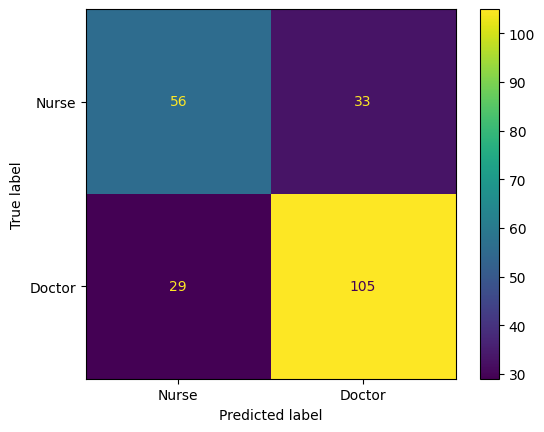

In [27]:
#new
#for census bias:
clf_svm_census_bias = SVC(C = 10, gamma = 'scale', probability=True)
clf_svm_census_bias.fit(x_train_census_bias, y_train_census_bias)

# confusion matrix of test data predictions
predictions = clf_svm_census_bias.predict(x_test_census_bias)
cm = confusion_matrix(y_test_census_bias, predictions, labels=clf_svm_census_bias.classes_)
disp_census_bias = ConfusionMatrixDisplay(confusion_matrix= cm, display_labels = ["Nurse", "Doctor"]) 

print("Doctors-nurses census bias dataset:")

# accuracy
correct = disp_census_bias.confusion_matrix[0,0] + disp_census_bias.confusion_matrix[1,1]
accuracy_census_bias = correct/(disp_census_bias.confusion_matrix[0,0] + disp_census_bias.confusion_matrix[0,1] + disp_census_bias.confusion_matrix[1,0] + disp_census_bias.confusion_matrix[1,1])
print(f"Accuracy = {accuracy_census_bias*100:.2f}%")
error_census_bias = 1 - accuracy_census_bias
print(f"Error = {error_census_bias*100:.2f}%")
precision_census_bias = disp_census_bias.confusion_matrix[0,0] / (disp_census_bias.confusion_matrix[0,0] + disp_census_bias.confusion_matrix[1,0])
print(f"Precision = {precision_census_bias}")
recall_census_bias = disp_census_bias.confusion_matrix[0,0] / (disp_census_bias.confusion_matrix[0,0] + disp_census_bias.confusion_matrix[0,1])
print(f"Recall = {recall_census_bias}")
f1_census_bias = (2 * precision_census_bias * recall_census_bias) / (precision_census_bias + recall_census_bias)
print(f"F1 score = {f1_census_bias}")

disp_census_bias.plot()
plt.show()

# SHAP Explanations
For some reason higher SHAP values are for nurse even though nurse label = 0 and doctor label = 1

In [28]:
shap.initjs()

In [29]:
idx = 100
print(x_test.iloc[idx])

Hand                   0
Health care            0
Research               0
Vision care            0
Stethoscope            0
                      ..
Currency               0
Money                  0
Composite material     0
Cuff                   0
Computed tomography    0
Name: 10, Length: 402, dtype: object


In [30]:
print(dataFrame["gender"].iloc[10])
print(dataFrame["id"].iloc[10])
print(dataFrame["Label"].iloc[10])

female
500. adorable-indian-female-doctor-nurse-stethoscope-aquamarine-dress-sitting-chair-grey-background-close-up-view-cute-142213933.jpg
1


## Example 1

In [31]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")
idx = 10
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[0], shap_values[0], x_test.iloc[idx,:], link="logit")

X does not have valid feature names, but SVC was fitted with feature names


Hand                   0
Health care            0
Research               0
Vision care            0
Stethoscope            0
                      ..
Currency               0
Money                  0
Composite material     0
Cuff                   0
Computed tomography    0
Name: 802, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


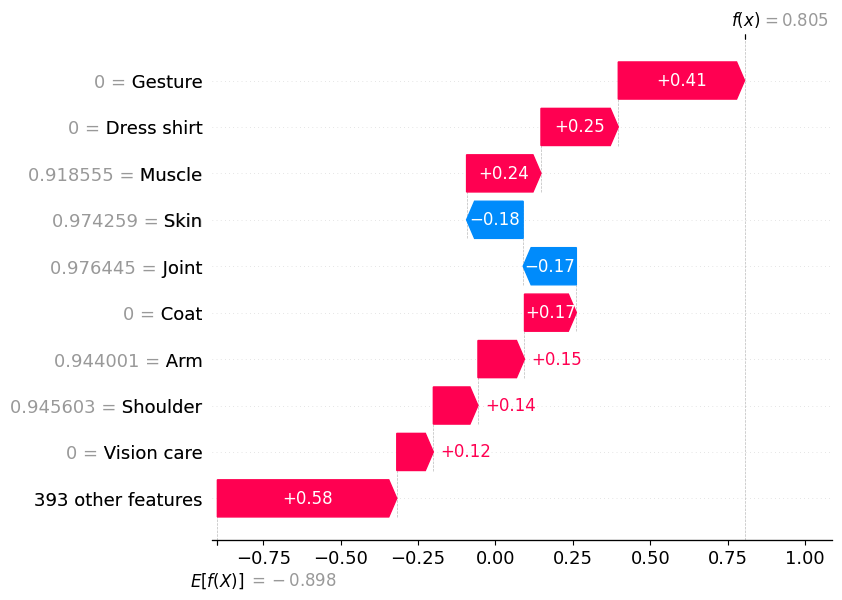

In [32]:
shap.initjs()
idx = 10
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[0], base_values=explainer.expected_value[0], data=x_test.iloc[idx,:]), max_display=10)


In [33]:
print(dataFrame["gender"].iloc[802])
print(dataFrame["id"].iloc[802])
print(dataFrame["Label"].iloc[802])

female
8. 800px_COLOURBOX3027525.jpg
0


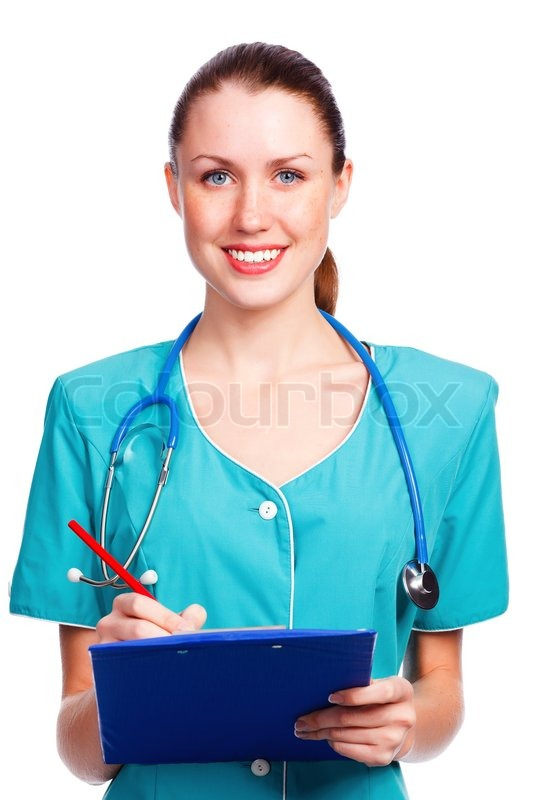

**Decision** **Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


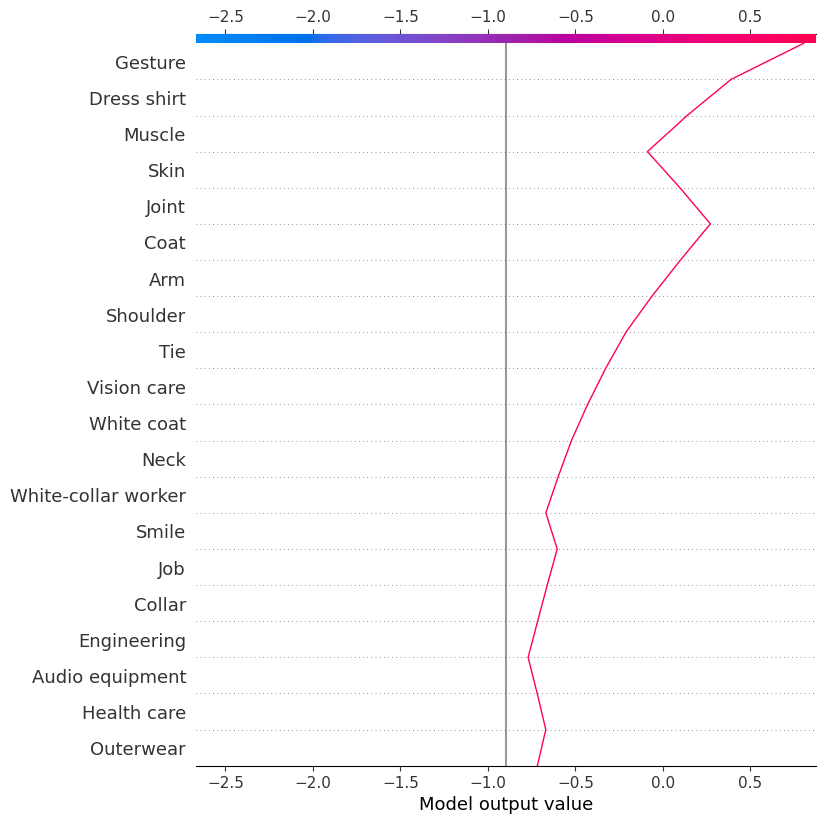

In [37]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 10
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


##Example 2

In [34]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")
idx = 41
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[0], shap_values[0], x_test.iloc[idx,:], link="logit")

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


Hand                   0
Health care            0
Research               0
Vision care            0
Stethoscope            0
                      ..
Currency               0
Money                  0
Composite material     0
Cuff                   0
Computed tomography    0
Name: 1073, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


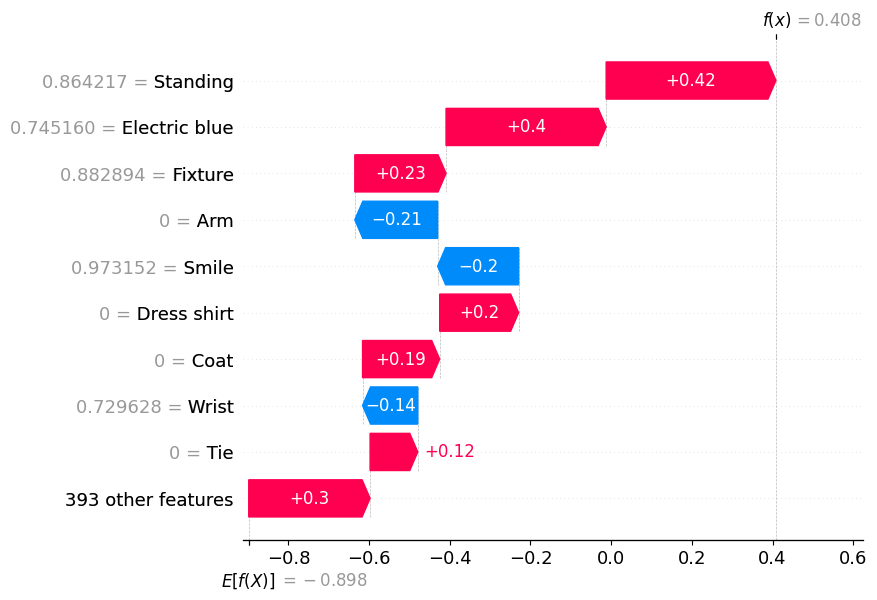

In [35]:
shap.initjs()
idx = 41
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[0], base_values=explainer.expected_value[0], data=x_test.iloc[idx,:]), max_display=10)


In [38]:
print(dataFrame["gender"].iloc[1073])
print(dataFrame["id"].iloc[1073])
print(dataFrame["Label"].iloc[1073])

male
80. iStock-489687332.jpg
0


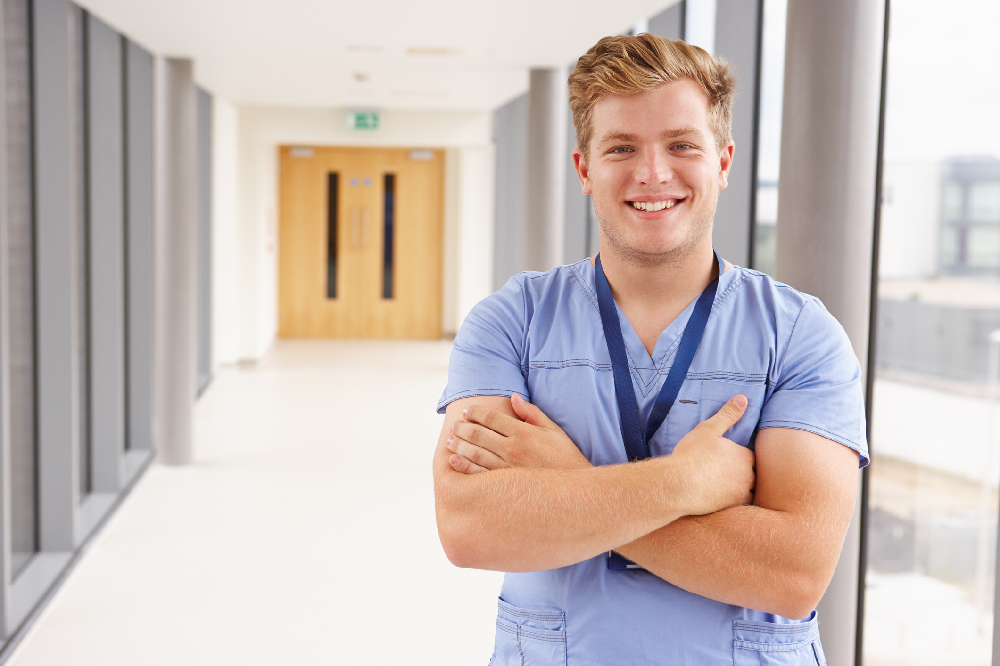

**Decision Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


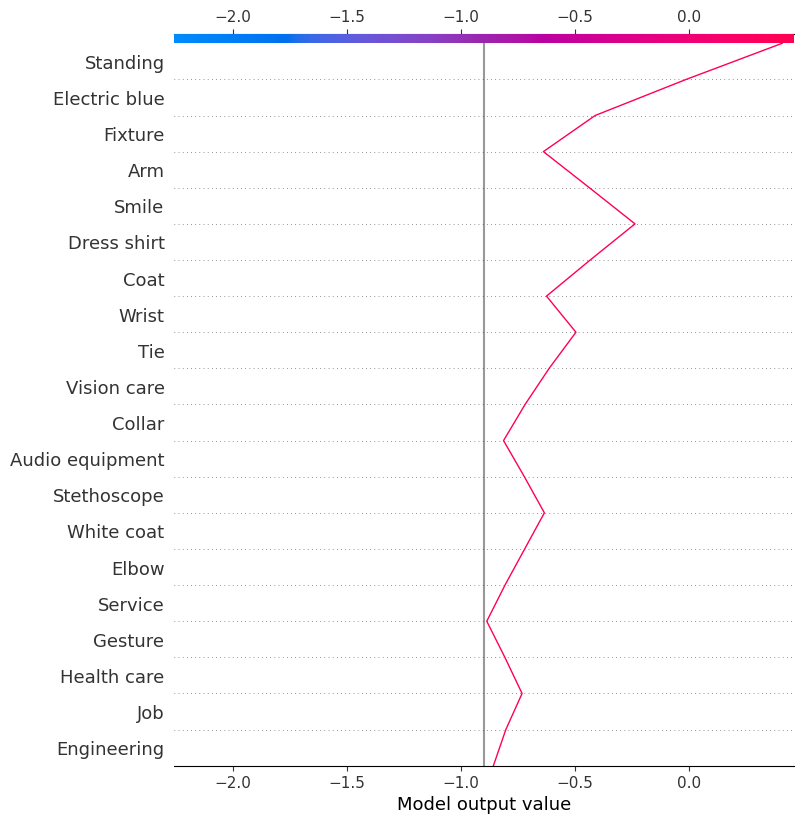

In [39]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 41
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


##Example 3

In [ ]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")
idx = 40
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[0], shap_values[0], x_test.iloc[idx,:], link="logit")

X does not have valid feature names, but SVC was fitted with feature names


Hand                   0
Health care            0
Research               0
Vision care            0
Stethoscope            0
                      ..
Currency               0
Money                  0
Composite material     0
Cuff                   0
Computed tomography    0
Name: 904, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


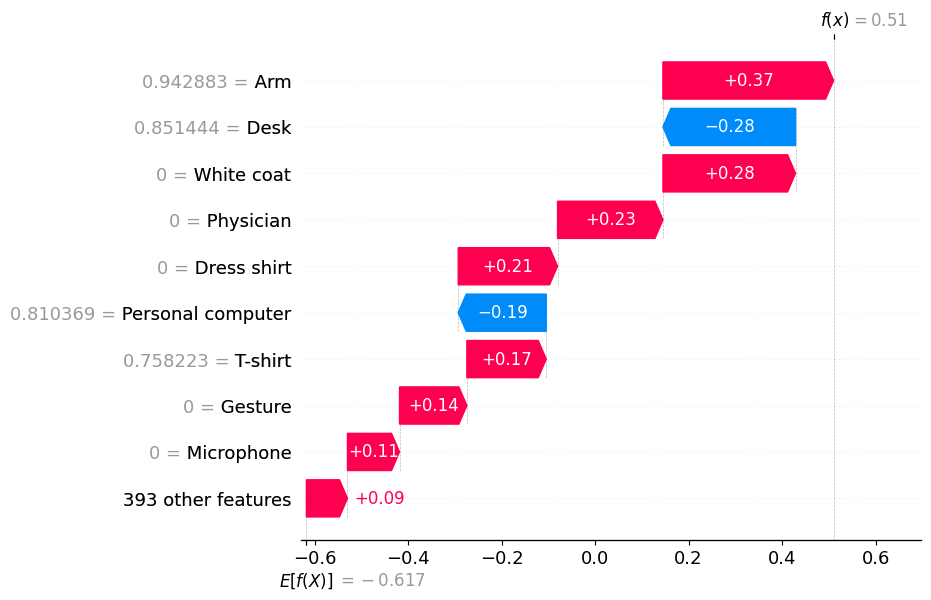

In [ ]:
shap.initjs()
idx = 40
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[0], base_values=explainer.expected_value[0], data=x_test.iloc[idx,:]), max_display=10)


In [ ]:
print(dataFrame["gender"].iloc[904])
print(dataFrame["id"].iloc[904])
print(dataFrame["Label"].iloc[904])

female
161. 31022023-portrait-of-female-nurse-working-at-nurses-station.jpg
0


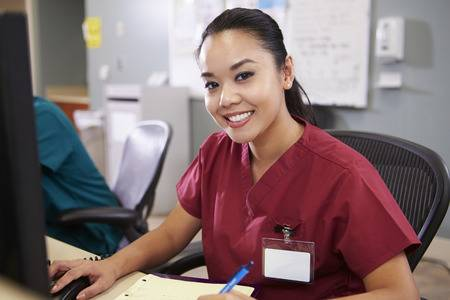

**Decision Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


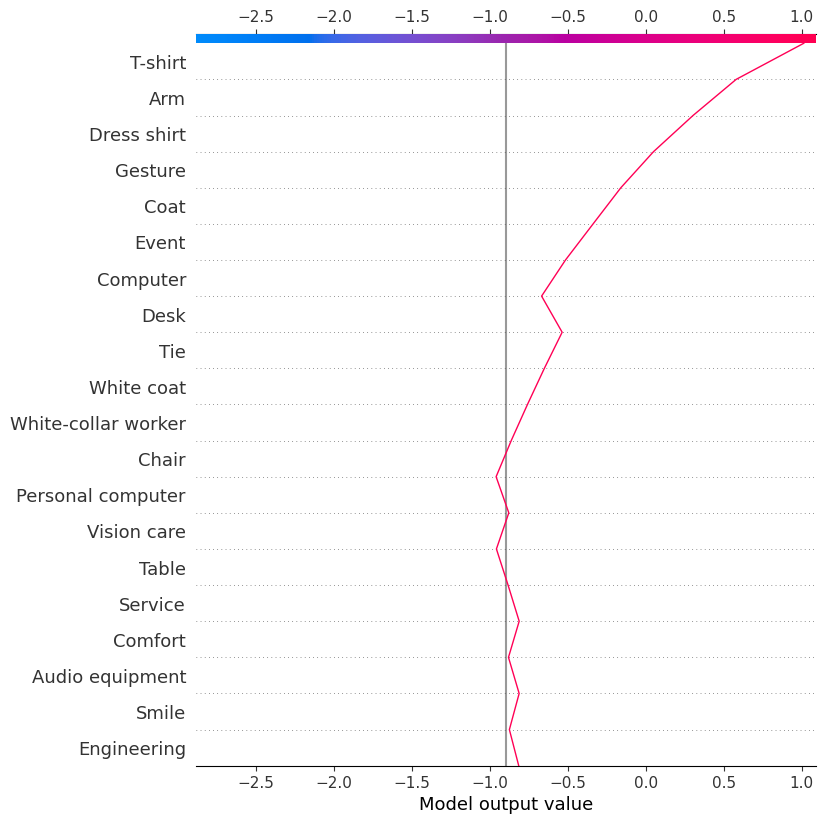

In [40]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 40
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


## Example 4

In [ ]:
shap.initjs()
idx = 2
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[0], shap_values[0], x_test.iloc[idx,:])

Hand                   0
Health care            0
Research               0
Vision care            0
Stethoscope            0
                      ..
Currency               0
Money                  0
Composite material     0
Cuff                   0
Computed tomography    0
Name: 613, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


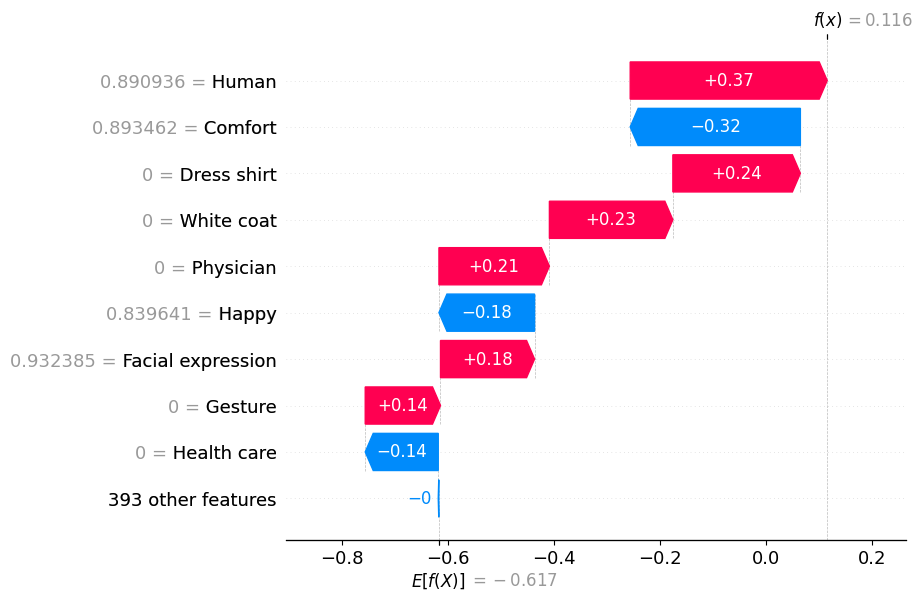

In [ ]:
shap.initjs()
idx = 2
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[0], base_values=explainer.expected_value[0], data=x_test.iloc[idx,:]), max_display=10)


In [ ]:
print(dataFrame["gender"].iloc[613])
print(dataFrame["id"].iloc[613])
print(dataFrame["Label"].iloc[613])

female
198. 1140-nurse-wheelchair-home-care-health.imgcache.rev01e17c1f3a958cbd32e4c7ebbb936de0.jpg
0


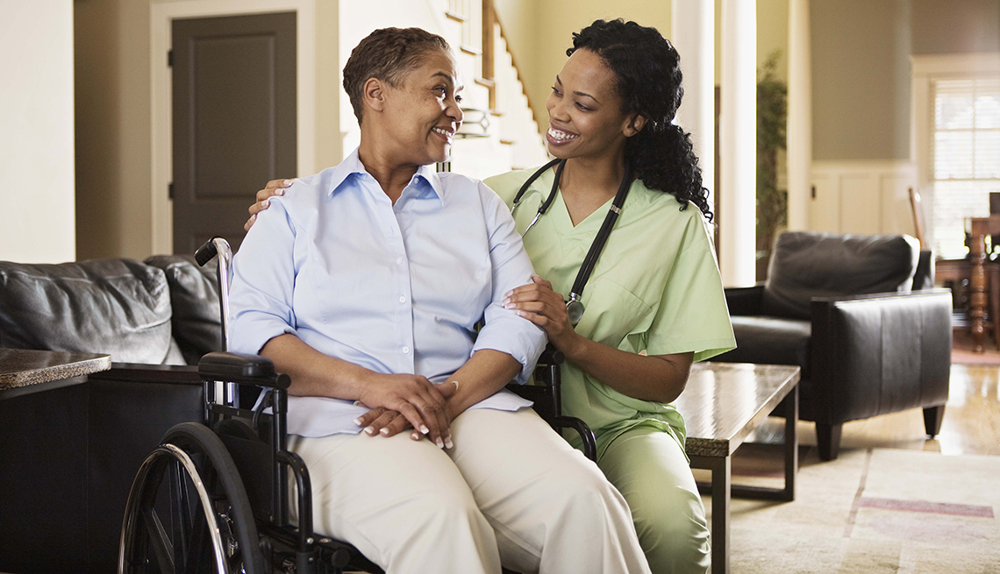

**Decision Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


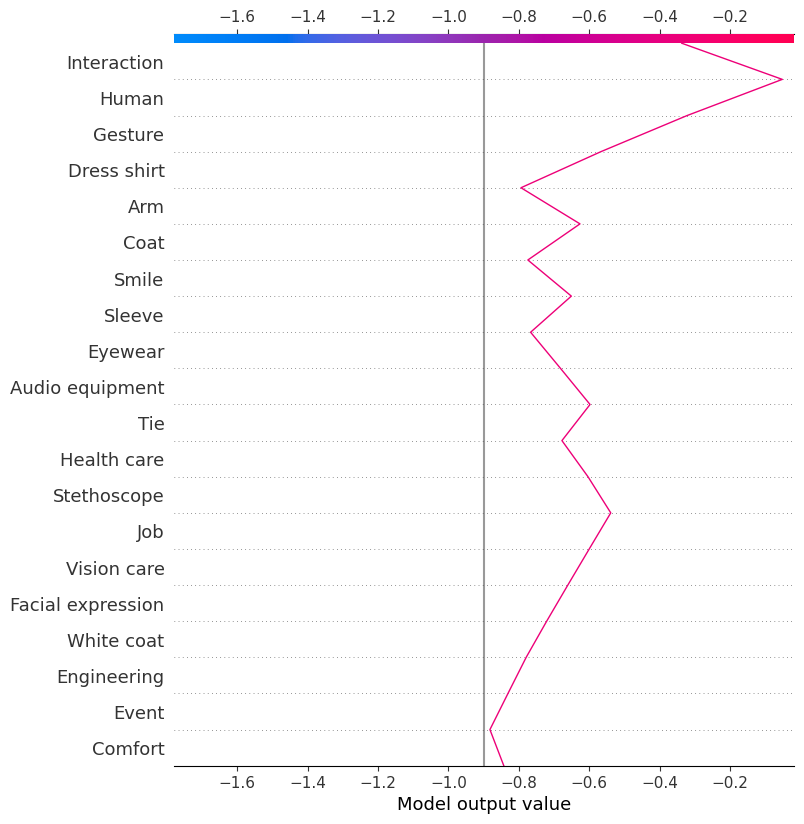

In [41]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 2
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


## Example 5

In [ ]:
shap.initjs()
idx = 5
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[0], shap_values[0], x_test.iloc[idx,:])

Hand                   0.959212
Health care                   0
Research                      0
Vision care                   0
Stethoscope                   0
                         ...   
Currency                      0
Money                         0
Composite material            0
Cuff                          0
Computed tomography           0
Name: 981, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


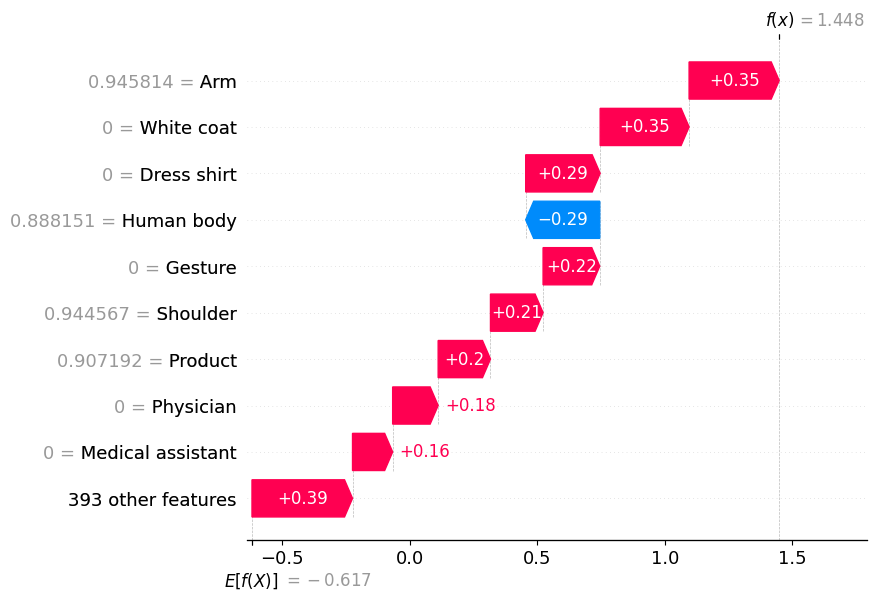

In [ ]:
shap.initjs()
idx = 5
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[0], base_values=explainer.expected_value[0], data=x_test.iloc[idx,:]), max_display=10)


In [ ]:
print(dataFrame["gender"].iloc[981])
print(dataFrame["id"].iloc[981])
print(dataFrame["Label"].iloc[981])

male
245. 103-Men-Ciel_800x.jpg
0


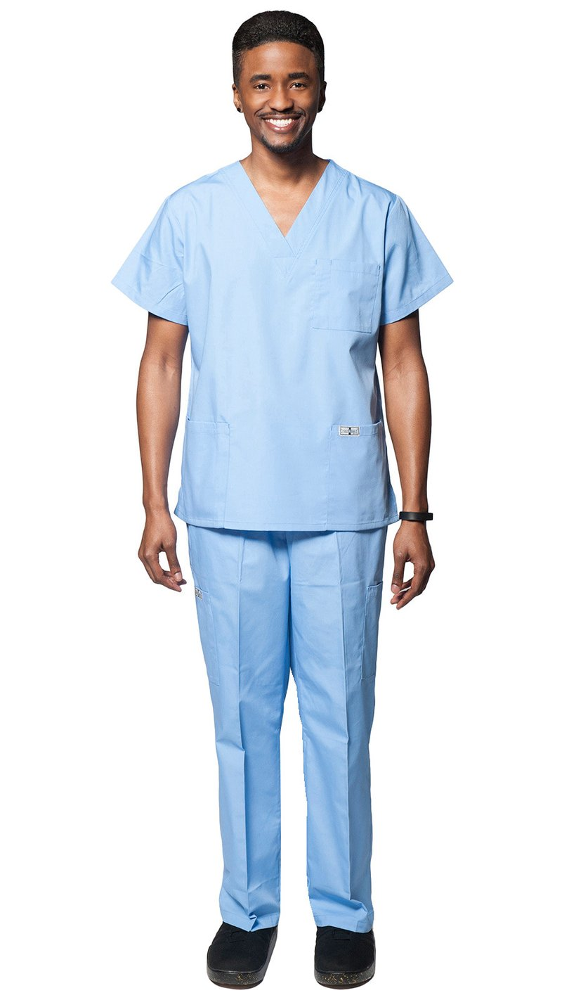

**Decision Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


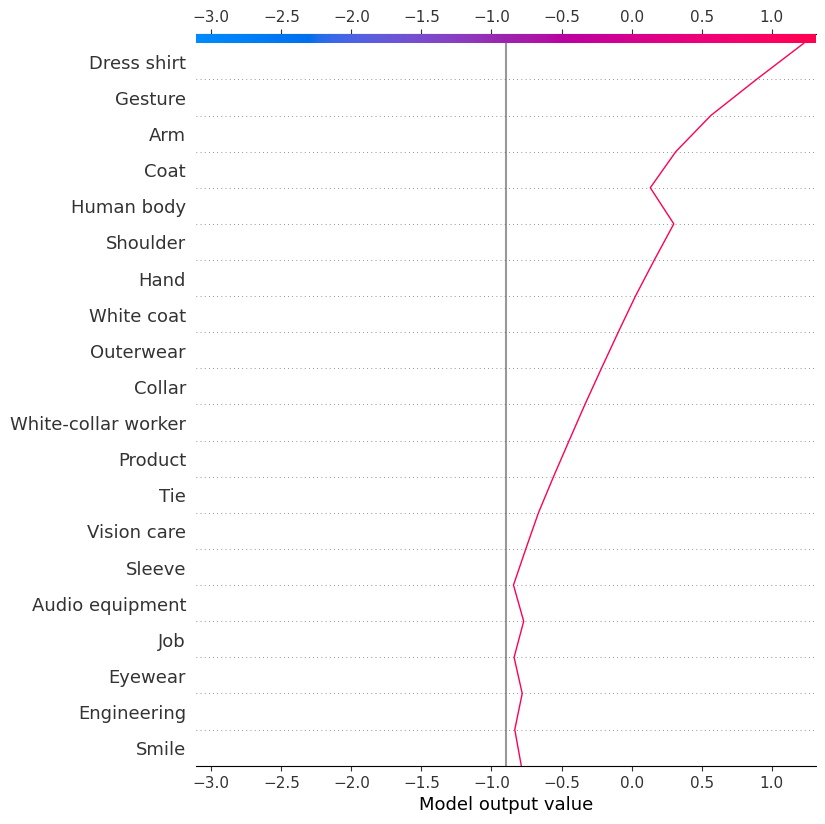

In [42]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 5
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


##Example 6

In [ ]:
shap.initjs()
idx = 100
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[1], shap_values[1], x_test.iloc[idx,:])

Hand                   0
Health care            0
Research               0
Vision care            0
Stethoscope            0
                      ..
Currency               0
Money                  0
Composite material     0
Cuff                   0
Computed tomography    0
Name: 10, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


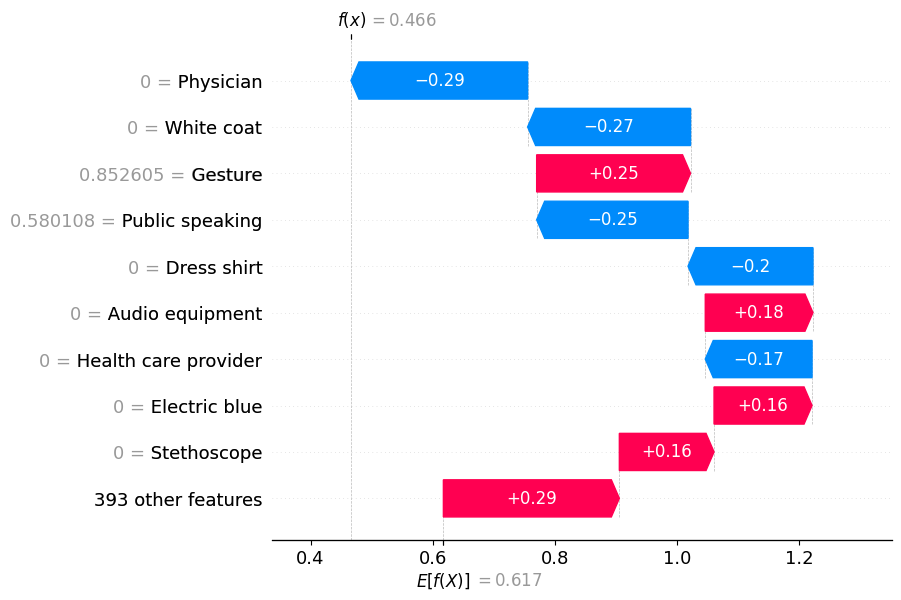

In [ ]:
shap.initjs()
idx = 100
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[1], base_values=explainer.expected_value[1], data=x_test.iloc[idx,:]), max_display=10)


In [ ]:
print(dataFrame["gender"].iloc[10])
print(dataFrame["id"].iloc[10])
print(dataFrame["Label"].iloc[10])

female
500. adorable-indian-female-doctor-nurse-stethoscope-aquamarine-dress-sitting-chair-grey-background-close-up-view-cute-142213933.jpg
1


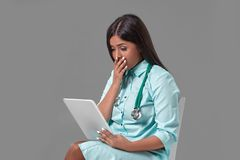

**Decision Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


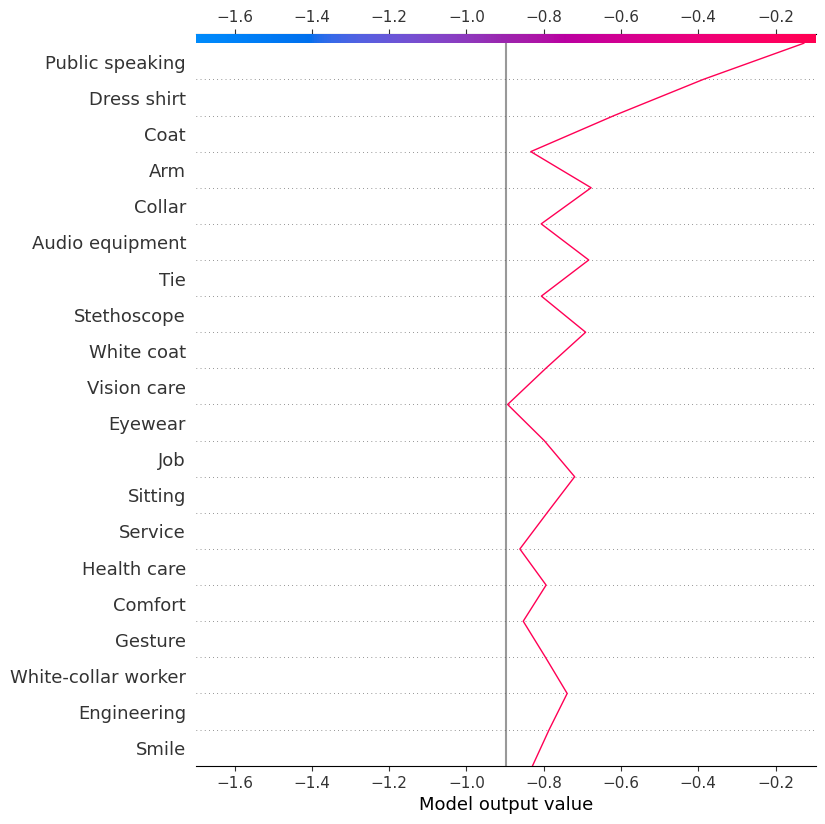

In [43]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 100
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


## Example 7

In [ ]:
shap.initjs()
idx = 12
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[1], shap_values[1], x_test.iloc[idx,:])

Hand                   0.957570
Health care            0.814439
Research                      0
Vision care                   0
Stethoscope            0.812684
                         ...   
Currency                      0
Money                         0
Composite material            0
Cuff                          0
Computed tomography           0
Name: 290, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


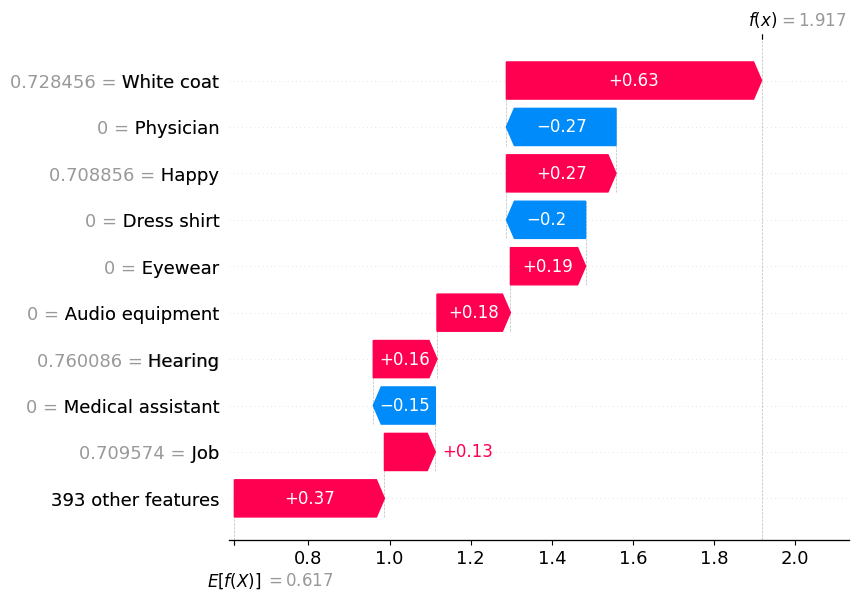

In [ ]:
shap.initjs()
idx = 12
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[1], base_values=explainer.expected_value[1], data=x_test.iloc[idx,:]), max_display=10)


In [ ]:
print(dataFrame["gender"].iloc[290])
print(dataFrame["id"].iloc[290])
print(dataFrame["Label"].iloc[290])

male
322. male-african-american-doctor-working-in-office-600x300.jpg
1


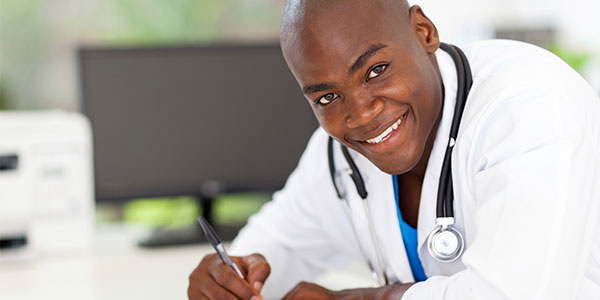

**Decision Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


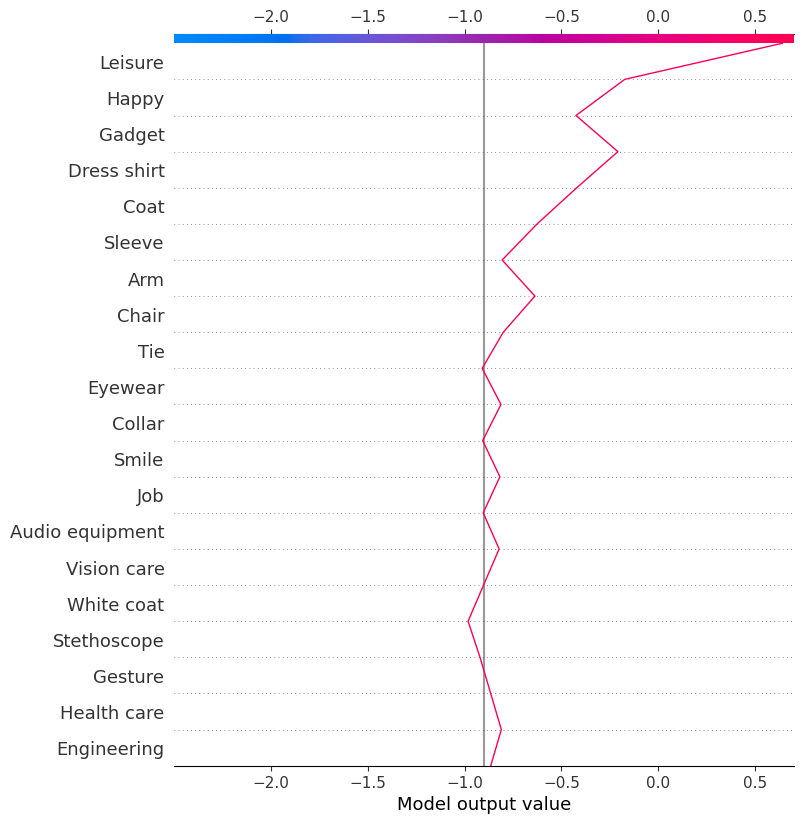

In [44]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 12
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


##Example 8

In [ ]:
shap.initjs()
idx = 24
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[1], shap_values[1], x_test.iloc[idx,:])

Hand                          0
Health care            0.879219
Research                      0
Vision care                   0
Stethoscope            0.853553
                         ...   
Currency                      0
Money                         0
Composite material            0
Cuff                          0
Computed tomography           0
Name: 71, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


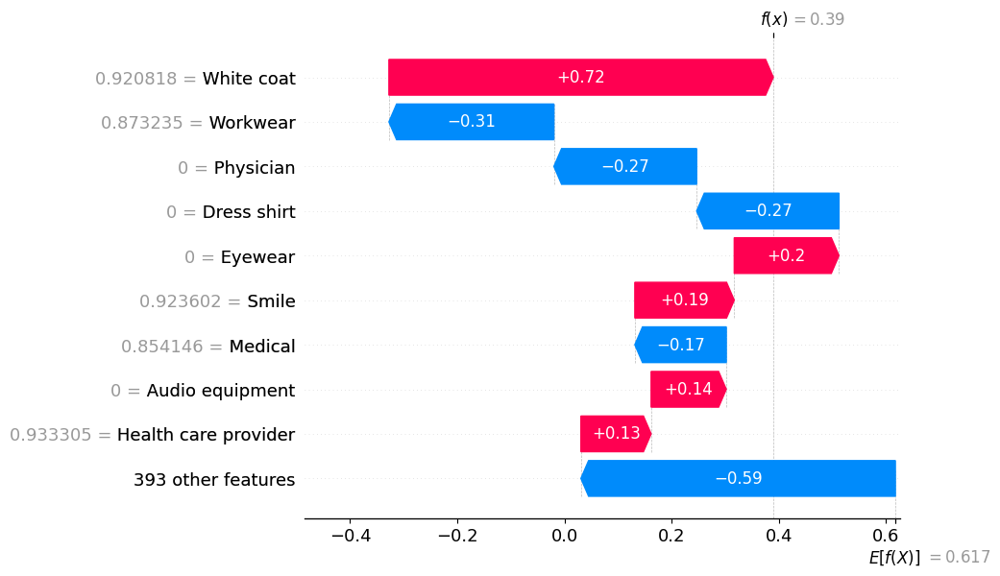

In [ ]:
shap.initjs()
idx = 24
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[1], base_values=explainer.expected_value[1], data=x_test.iloc[idx,:]), max_display=10)


In [ ]:
print(dataFrame["gender"].iloc[71])
print(dataFrame["id"].iloc[71])
print(dataFrame["Label"].iloc[71])

female
118. smiling-female-doctor-holding-medical-records-lab-coat-her-office-clipboard-looking-camera-56673035.jpg
1


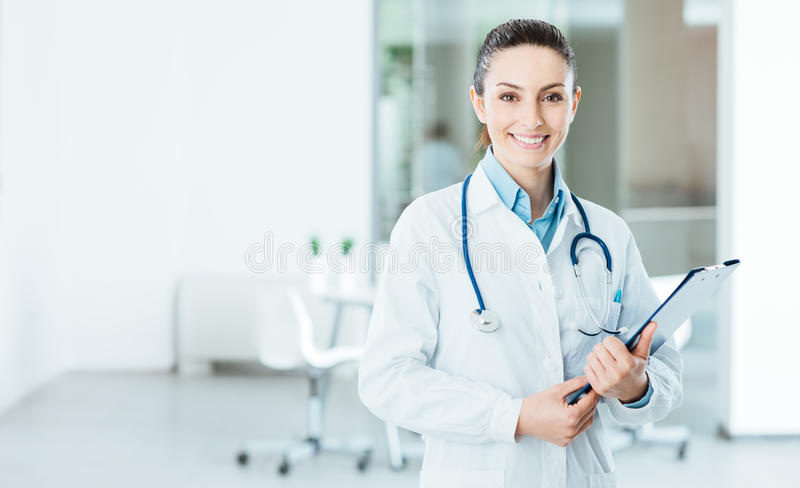

**Decision Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


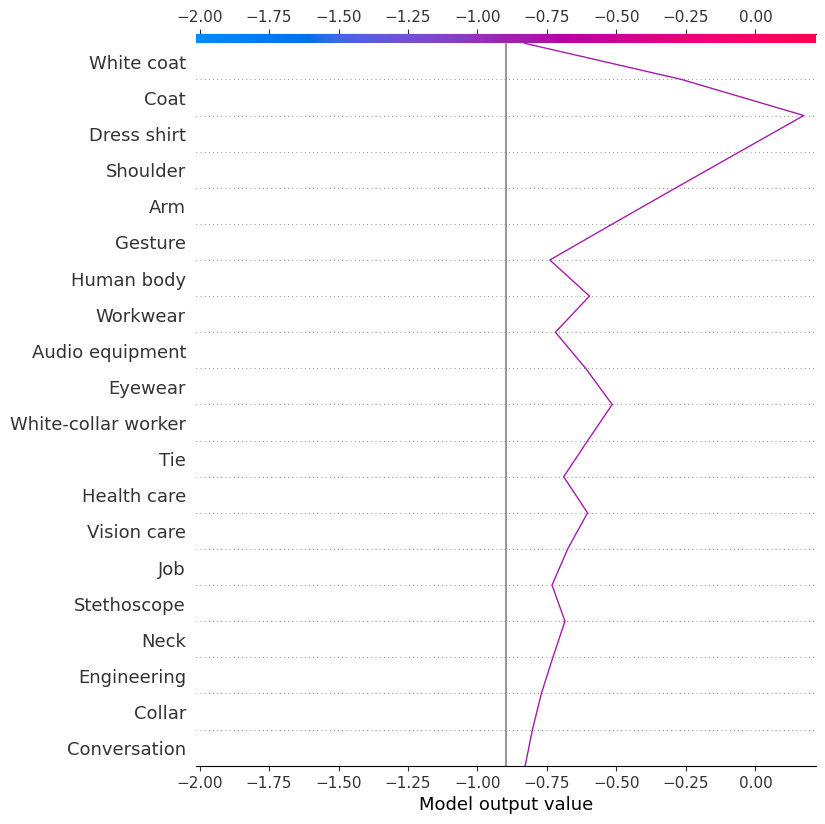

In [45]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 24
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


##Example 9

In [ ]:
shap.initjs()
idx = 25
print(x_test.iloc[idx])
shap_values = explainer.shap_values(x_test.iloc[idx,:])
shap.force_plot(explainer.expected_value[1], shap_values[1], x_test.iloc[idx,:])

Hand                   0
Health care            0
Research               0
Vision care            0
Stethoscope            0
                      ..
Currency               0
Money                  0
Composite material     0
Cuff                   0
Computed tomography    0
Name: 393, Length: 402, dtype: object


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


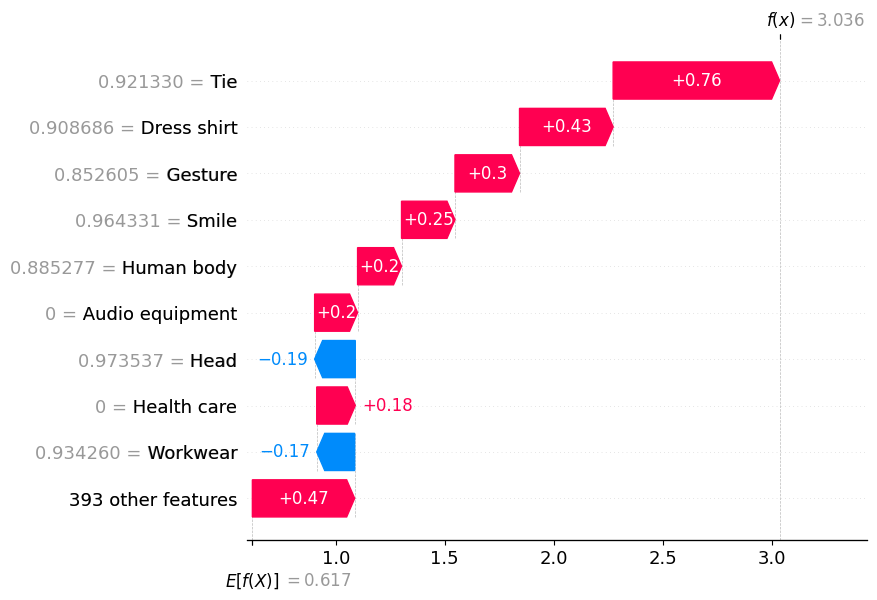

In [ ]:
shap.initjs()
idx = 25
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Generate SHAP waterfall plot for data point
shap.waterfall_plot(shap.Explanation(values=shap_values[1], base_values=explainer.expected_value[1], data=x_test.iloc[idx,:]), max_display=10)


In [ ]:
print(dataFrame["gender"].iloc[393])
print(dataFrame["id"].iloc[393])
print(dataFrame["Label"].iloc[393])

male
11. doctor-uniform-250x250.jpg
1


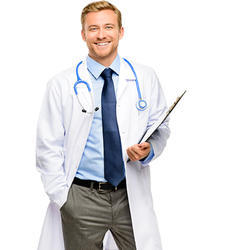

**Decision Plot**

X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names
X does not have valid feature names, but SVC was fitted with feature names


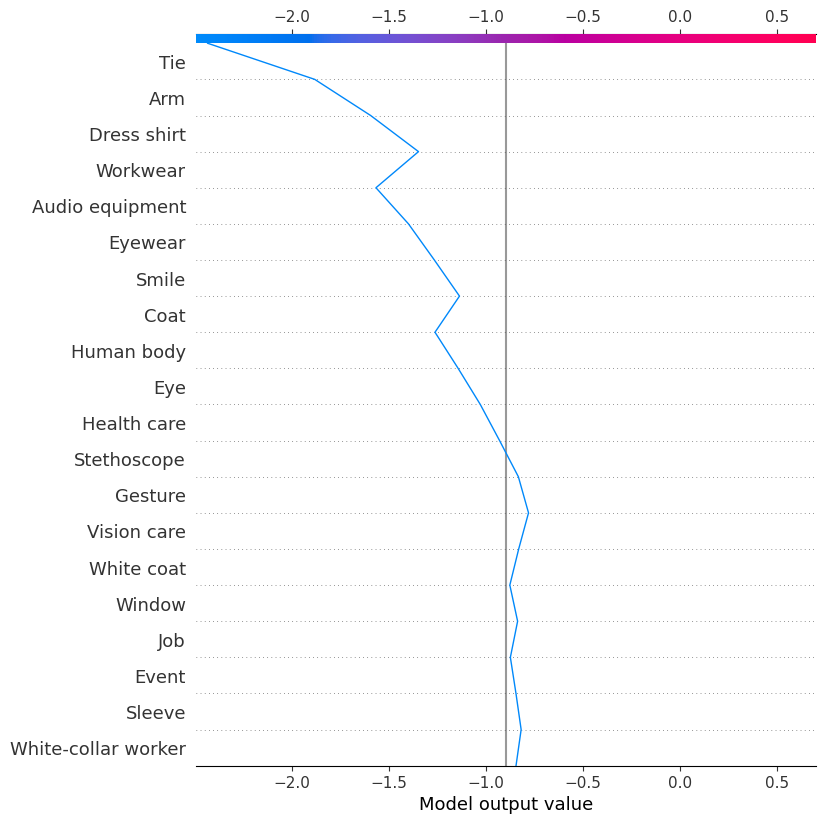

In [46]:
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[5:10,:], link="logit")

# Compute SHAP values for a single data point
idx = 25
shap_values = explainer.shap_values(x_test.iloc[idx,:])

# Create a decision plot of the SHAP values for the single data point
shap.decision_plot(explainer.expected_value[0], shap_values[0], feature_names=x_test.columns.tolist())


## Shapley values Force plot

In [ ]:
# explain all the predictions in the test set. 
shap.initjs()
explainer = shap.KernelExplainer(clf_svm.predict_proba, x_train.iloc[0:1,:])
shap_values = explainer.shap_values(x_test)
shap.force_plot(explainer.expected_value[0], shap_values[0], x_test)

Output hidden; open in https://colab.research.google.com to view.